In [349]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline

In [351]:
data = pd.read_csv('datasets/Seasons_Stats.csv')

FileNotFoundError: File b'datasets/Seasons_Stats.csv' does not exist

In [ ]:
print(data.shape)
data.head()

In [4]:
data.dropna(subset=['GS'], inplace=True)

In [5]:
print(data.shape)
data.head()

(18233, 53)


,Unnamed: 0,Year,Player,Pos,Age,Tm,G,GS,MP,PER,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
5730,5730,1980.0,Tiny Archibald*,PG,31.0,BOS,80.0,80.0,2864.0,15.3,...,0.830,59.0,138.0,197.0,671.0,106.0,10.0,242.0,218.0,1131.0
5748,5748,1980.0,Larry Bird*,PF,23.0,BOS,82.0,82.0,2955.0,20.5,...,0.836,216.0,636.0,852.0,370.0,143.0,53.0,263.0,279.0,1745.0
5781,5781,1980.0,M.L. Carr,SF,29.0,BOS,82.0,7.0,1994.0,14.6,...,0.739,106.0,224.0,330.0,156.0,120.0,36.0,143.0,214.0,914.0
5786,5786,1980.0,Don Chaney,SG,33.0,BOS,60.0,0.0,523.0,7.8,...,0.762,31.0,42.0,73.0,38.0,31.0,11.0,33.0,80.0,167.0
5802,5802,1980.0,Dave Cowens*,C,31.0,BOS,66.0,55.0,2159.0,14.8,...,0.779,126.0,408.0,534.0,206.0,69.0,61.0,108.0,216.0,940.0


In [6]:
data = data.loc[:,'Year':'PTS']
data.head()

,Year,Player,Pos,Age,Tm,G,GS,MP,PER,TS%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
5730,1980.0,Tiny Archibald*,PG,31.0,BOS,80.0,80.0,2864.0,15.3,0.574,...,0.830,59.0,138.0,197.0,671.0,106.0,10.0,242.0,218.0,1131.0
5748,1980.0,Larry Bird*,PF,23.0,BOS,82.0,82.0,2955.0,20.5,0.538,...,0.836,216.0,636.0,852.0,370.0,143.0,53.0,263.0,279.0,1745.0
5781,1980.0,M.L. Carr,SF,29.0,BOS,82.0,7.0,1994.0,14.6,0.526,...,0.739,106.0,224.0,330.0,156.0,120.0,36.0,143.0,214.0,914.0
5786,1980.0,Don Chaney,SG,33.0,BOS,60.0,0.0,523.0,7.8,0.402,...,0.762,31.0,42.0,73.0,38.0,31.0,11.0,33.0,80.0,167.0
5802,1980.0,Dave Cowens*,C,31.0,BOS,66.0,55.0,2159.0,14.8,0.477,...,0.779,126.0,408.0,534.0,206.0,69.0,61.0,108.0,216.0,940.0


In [7]:
data = data.reset_index(drop = True)
data.head()

,Year,Player,Pos,Age,Tm,G,GS,MP,PER,TS%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1980.0,Tiny Archibald*,PG,31.0,BOS,80.0,80.0,2864.0,15.3,0.574,...,0.830,59.0,138.0,197.0,671.0,106.0,10.0,242.0,218.0,1131.0
1,1980.0,Larry Bird*,PF,23.0,BOS,82.0,82.0,2955.0,20.5,0.538,...,0.836,216.0,636.0,852.0,370.0,143.0,53.0,263.0,279.0,1745.0
2,1980.0,M.L. Carr,SF,29.0,BOS,82.0,7.0,1994.0,14.6,0.526,...,0.739,106.0,224.0,330.0,156.0,120.0,36.0,143.0,214.0,914.0
3,1980.0,Don Chaney,SG,33.0,BOS,60.0,0.0,523.0,7.8,0.402,...,0.762,31.0,42.0,73.0,38.0,31.0,11.0,33.0,80.0,167.0
4,1980.0,Dave Cowens*,C,31.0,BOS,66.0,55.0,2159.0,14.8,0.477,...,0.779,126.0,408.0,534.0,206.0,69.0,61.0,108.0,216.0,940.0


In [1]:
import pandas as pd
shots = pd.read_csv('datasets/shot_logs.csv')

In [2]:
print(shots.shape)
shots.head()

(128069, 21)


,GAME_ID,MATCHUP,LOCATION,W,FINAL_MARGIN,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,...,SHOT_DIST,PTS_TYPE,SHOT_RESULT,CLOSEST_DEFENDER,CLOSEST_DEFENDER_PLAYER_ID,CLOSE_DEF_DIST,FGM,PTS,player_name,player_id
0,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,1,1,1:09,10.8,2,...,7.7,2,made,"Anderson, Alan",101187,1.3,1,2,brian roberts,203148
1,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,2,1,0:14,3.4,0,...,28.2,3,missed,"Bogdanovic, Bojan",202711,6.1,0,0,brian roberts,203148
2,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,3,1,0:00,NaN,3,...,10.1,2,missed,"Bogdanovic, Bojan",202711,0.9,0,0,brian roberts,203148
3,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,4,2,11:47,10.3,2,...,17.2,2,missed,"Brown, Markel",203900,3.4,0,0,brian roberts,203148
4,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,5,2,10:34,10.9,2,...,3.7,2,missed,"Young, Thaddeus",201152,1.1,0,0,brian roberts,203148


In [354]:
names = shots['player_name'].tolist()

In [355]:
shots.dropna(subset=['GAME_CLOCK'], inplace=True)
shots.dropna(subset=['SHOT_CLOCK'], inplace=True)
shots = shots.reset_index(drop = True)

In [7]:
def shots_in_range(shot_range, df, str):
    
    these_shots = []
    all_shot_idxs = range(df.shape[0])
    
    for idx in all_shot_idxs:
        
        this_shot_dist = df.loc[idx, str]
        if this_shot_dist >= shot_range[0] and this_shot_dist < shot_range[1]:
            these_shots.append(idx)
            
    return these_shots


def clock_in_range(ran, df, shots_idx):
    
    data_final = pd.DataFrame()
    
    for idx in shots_idx:
        
        #print(df.loc[idx])
        this_shot_clock = df.loc[idx, 'SHOT_CLOCK']
                
        for r in shot_clock_ranges:
            
            if this_shot_clock >= r[0] and this_shot_clock < r[1]:
                val = df.loc[idx, 'SHOT_RESULT']
                total_shots = 1
            else:
                val = 0
                total_shots = 0

            key = (ran[0], r[0])
            value = [val, total_shots]
            
            if key not in dictionary:
                dictionary[key] = value
            else:
                dictionary[key][0] = dictionary[key][0] + val
                dictionary[key][1] = dictionary[key][1] + total_shots
                
            d = pd.DataFrame({'dist_range': [ran[0]], 'clock_range': [r[0]], 'shot_made': [val]})
            data_final = data_final.append(d)
    
    return data_final

In [3]:
name = input('enter player name: ')

enter player name: giannis antetokounmpo


In [8]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

player = shots.loc[shots['player_name'] == name]

new = player[['SHOT_DIST', 'SHOT_CLOCK', 'SHOT_RESULT']].copy()
new['SHOT_RESULT'] = new['SHOT_RESULT'].map({'made': 1, 'missed': 0})

new.reset_index(inplace=True)
new

,index,SHOT_DIST,SHOT_CLOCK,SHOT_RESULT
0,77687,2.8,NaN,0
1,77688,20.0,6.5,0
2,77689,10.8,13.6,1
3,77690,24.8,3.0,0
4,77691,7.4,20.2,0
5,77692,18.1,3.6,1
6,77693,6.8,21.4,0
7,77694,9.7,6.0,0
8,77695,3.3,1.6,1
9,77696,5.0,8.4,1


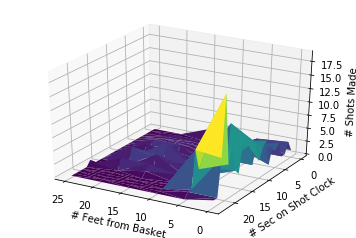

In [9]:
dist = list(new.SHOT_DIST)
data_final = pd.DataFrame()

dictionary = {}
shot_dist_ranges = []
shot_clock_ranges = []

for i in range(0, 6):
    shot_dist_ranges.append((5*i, 5*i+5))

for i in range(0, 24):
    shot_clock_ranges.append((i, i+1))

for s in shot_dist_ranges:
    shots_idx = shots_in_range(s, new, 'SHOT_DIST')

    d = clock_in_range(s, new, shots_idx)
    data_final = data_final.append(d)

data__ = pd.DataFrame()

thresh = {

    0 : 0.61,
    5 : 0.39,
    10 : 0.41,
    15 : 0.42,
    20 : 0.37,
    25 : 0.34
}

for key in dictionary:

    dist_start = key[0]
    clock_start = key[1]

    if dictionary[key][1] != 0:

        if dictionary[key][0] / dictionary[key][1] > thresh[dist_start]:
            per = 1   
    else:
        per = 0.0

    d = pd.DataFrame({'dist_start_range': [dist_start], 'clock_start_range': [clock_start], 'shots_percent': [per], 'shots_made': [dictionary[key][0]], 'total_shots_taken':[dictionary[key][1]]})
    data__ = data__.append(d)

    
X = data__['dist_start_range'].tolist()
Y = data__['clock_start_range'].tolist()
Z = data__['shots_made'].tolist()
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.view_init(30, 120)

ax.plot_trisurf(X, Y, Z, cmap=plt.cm.viridis, linewidth=0.6)
ax.set_xlabel('# Feet from Basket')
ax.set_ylabel('# Sec on Shot Clock')
ax.set_zlabel('# Shots Made')

plt.show()
    

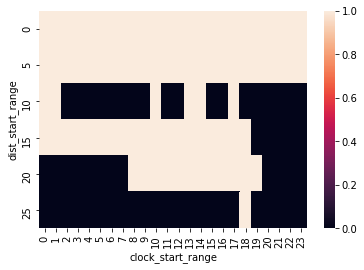

In [10]:
res = data__.pivot(index='dist_start_range', columns='clock_start_range', values='shots_percent')
sns.heatmap(res, annot=False)

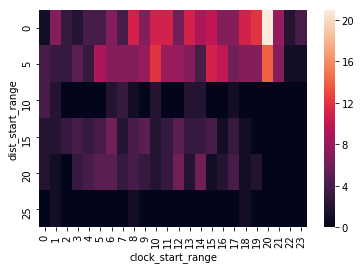

In [11]:
res = data__.pivot(index='dist_start_range', columns='clock_start_range', values='total_shots_taken')
sns.heatmap(res, annot=False)

# Percentage shots made thresholded

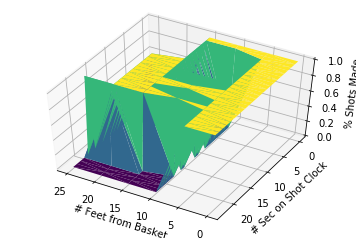

In [14]:
X = data__['dist_start_range'].tolist()
Y = data__['clock_start_range'].tolist()
Z = data__['shots_percent'].tolist()

fig = plt.figure()
ax = fig.gca(projection='3d')
ax.view_init(50, 120)


ax.plot_trisurf(X, Y, Z, cmap=plt.cm.viridis, linewidth=0.6)

ax.set_xlabel('# Feet from Basket')
ax.set_ylabel('# Sec on Shot Clock')
ax.set_zlabel('% Shots Made')

plt.show()

#for angle in range(70, 210, 2):
    
    #ax.plot_trisurf(X, Y, Z, cmap=plt.cm.viridis, linewidth=0.2)
    #ax.view_init(30, angle)
    #filename = 'step' + str(angle) + '.png'
    #plt.savefig(filename, dpi=96)
    #plt.gca()
    #plt.show()

# Shots Taken

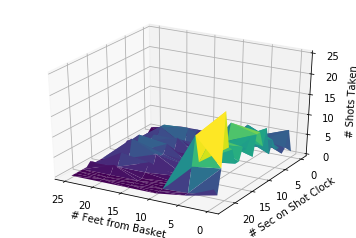

In [13]:
X = data__['dist_start_range'].tolist()
Y = data__['clock_start_range'].tolist()
Z = data__['total_shots_taken'].tolist()
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.view_init(30, 120)

ax.plot_trisurf(X, Y, Z, cmap=plt.cm.viridis, linewidth=0.6)
ax.set_xlabel('# Feet from Basket')
ax.set_ylabel('# Sec on Shot Clock')
ax.set_zlabel('# Shots Taken')
ax.set_zlim3d(0,25)
plt.show()

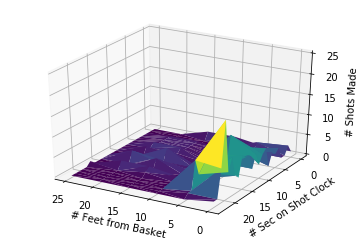

In [12]:
X = data__['dist_start_range'].tolist()
Y = data__['clock_start_range'].tolist()
Z = data__['shots_made'].tolist()
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.view_init(30, 120)

ax.plot_trisurf(X, Y, Z, cmap=plt.cm.viridis, linewidth=0.6)
ax.set_xlabel('# Feet from Basket')
ax.set_ylabel('# Sec on Shot Clock')
ax.set_zlabel('# Shots Made')
ax.set_zlim3d(0,25)
plt.show()

In [190]:
# < 5 ft: .61
# 5 - 9 ft: .39
#10 - 14: .41
#15 - 19: .42
#20 - 24: .37
#25 - 29: .34

In [171]:
for region, df_region in shots.groupby('GAME_ID'):
    print(df_region.shape)
    print(df_region)
    print("\n")

(157, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
26011  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26012  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26013  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26014  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26015  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26016  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26017  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26018  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26019  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26020  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26501  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26502  21400001  OCT 28, 2014 - NOP vs. ORL        H  W            17   
26503  21400001  OCT 28, 2014 - NOP vs. O

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8958   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8959   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8960   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8961   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8962   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8963   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8964   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8965   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8966   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8967   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8968   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8969   21400003  OCT 28, 2014 - LAL vs. HOU        H  L           -18   
8970   21400003  OCT 28, 2014 - LAL vs. HOU        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
50870   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50871   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50872   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50873   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50874   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50875   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50876   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50877   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50878   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50879   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50880   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50881   21400006  OCT 29, 2014 - BOS vs. BKN        H  W            16   
50882   21400006  OCT 29, 2014 - BOS v

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
75602   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75603   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75604   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75605   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75606   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75607   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75608   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75609   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75610   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75611   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75612   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75613   21400009  OCT 29, 2014 - MEM vs. MIN        H  W             4   
75614   21400009  OCT 29, 2014 - MEM v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5305   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5306   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5307   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5308   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5309   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5310   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5311   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5312   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5313   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5314   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5315   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5618   21400012  OCT 29, 2014 - UTA vs. HOU        H  L           -11   
5619   21400012  OCT 29, 2014 - UTA vs. HOU        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
98049   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
98050   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
98051   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
98052   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
98053   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
98876   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
98877   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
98878   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
99591   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
99592   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
99593   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
99594   21400015    OCT 29, 2014 - OKC @ POR        A  L           -17   
99595   21400015    OCT 29, 2014 - OKC

[102 rows x 21 columns]


(128, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5296   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5297   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5298   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5299   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5300   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5301   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5302   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5303   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5304   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5612   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5613   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5614   21400019    OCT 30, 2014 - UTA @ DAL        A  L           -18   
5615   21400019

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
46188  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46189  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46190  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46191  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46452  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46453  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46454  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46455  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46456  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46457  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46458  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46459  21400021  OCT 31, 2014 - IND vs. MEM        H  L            -8   
46460  21400021  OCT 31, 2014 - IND vs. MEM        

[112 rows x 21 columns]


(143, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54763  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
54764  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
54765  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
54766  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
54767  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
55187  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
55188  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
55189  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
55190  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
55191  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
55506  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
55507  21400024    OCT 31, 2014 - SAS @ PHX        A  L            -5   
55508  21400024

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
93708   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
93709   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
93710   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
93711   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
93712   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
94213   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
94214   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
94770   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
94771   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
94772   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
94773   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
94774   21400025  OCT 31, 2014 - SAC vs. POR        H  W             9   
95549   21400025  OCT 31, 2014 - SAC v

[142 rows x 21 columns]


(127, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
29657  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
29658  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
29659  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30472  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30473  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30474  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30475  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30476  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30477  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30478  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30479  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30480  21400029    NOV 01, 2014 - TOR @ ORL        A  W            13   
30481  21400029

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
68631  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
68632  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
68633  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
69894  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
69895  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
69896  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
69897  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
70212  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
70213  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
70214  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
70215  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
70216  21400030  NOV 01, 2014 - PHI vs. MIA        H  L           -18   
70217  21400030  NOV 01, 2014 - PHI vs. MIA        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
50859  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50860  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50861  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50862  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50863  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50864  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50865  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50866  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50867  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50868  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
50869  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
51169  21400034    NOV 01, 2014 - BOS @ HOU        A  L           -14   
51170  21400034    NOV 01, 2014 - BOS @ HOU        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
106569  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
106570  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
106571  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
106572  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
106573  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
106574  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
106575  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
106576  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
107347  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
107348  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
107349  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
107350  21400035    NOV 01, 2014 - CHI @ MIN        A  W             1   
107351  21400035    NOV 01, 2014 - CHI

[161 rows x 21 columns]


(147, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
93703   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
93704   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
93705   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
93706   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
93707   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
94211   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
94212   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
94766   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
94767   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
94768   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
94769   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
95537   21400039    NOV 02, 2014 - SAC @ LAC        A  W             6   
95

[145 rows x 21 columns]


(85, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
68623  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
68624  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
68625  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
68626  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
68627  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
68628  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
68629  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
68630  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
69885  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
69886  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
69887  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
69888  21400043  NOV 03, 2014 - PHI vs. HOU        H  L           -11   
69889  21400043 

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
58629  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
58630  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59308  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59309  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59310  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59311  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59312  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59313  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59314  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59315  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59316  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59317  21400047  NOV 03, 2014 - DEN vs. SAC        H  L            -5   
59318  21400047  NOV 03, 2014 - DEN vs. SAC        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5264    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5265    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5266    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5267    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5268    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5269    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5270    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5271    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5272    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5273    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5274    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5275    21400048    NOV 03, 2014 - UTA @ LAC        A  L            -6   
5276    21400048    NOV 03, 2014 - UTA

[126 rows x 21 columns]


(103, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
29650   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
29651   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
29652   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
29653   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
29654   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
29655   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
30455   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
30456   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
30457   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
30458   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
30459   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
30460   21400052  NOV 04, 2014 - TOR vs. OKC        H  W            12   
31

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38739   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38740   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38741   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38742   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38743   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38744   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38745   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38746   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38747   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38748   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38749   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38750   21400053    NOV 04, 2014 - ORL @ CHI        A  L            -8   
38751   21400053    NOV 04, 2014 - ORL

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
338    21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
339    21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1170   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1171   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1172   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1173   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1174   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1175   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1176   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1177   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1178   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1179   21400057  NOV 05, 2014 - CHA vs. MIA        H  W             7   
1180   21400057  NOV 05, 2014 - CHA vs. MIA        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38723  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38724  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38725  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38726  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38727  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38728  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38729  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38730  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38731  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38732  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38733  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38734  21400058    NOV 05, 2014 - ORL @ PHI        A  W             2   
38735  21400058    NOV 05, 2014 - ORL @ PHI        

[138 rows x 21 columns]


(128, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
71553   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
71554   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
71555   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
71556   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
71882   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
71883   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
71884   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
71885   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
71886   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
72221   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
72222   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
72223   21400062  NOV 05, 2014 - MIL vs. CHI        H  L            -9   
72

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
21667  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21668  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21669  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21670  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21671  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21672  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21673  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21674  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21675  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21676  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21964  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21965  21400063  NOV 05, 2014 - WAS vs. IND        H  W             2   
21966  21400063  NOV 05, 2014 - WAS vs. IND        

(116, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5253   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5254   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5255   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5256   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5257   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5258   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5259   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5260   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5261   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5262   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5263   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5587   21400066  NOV 05, 2014 - UTA vs. CLE        H  W             2   
5588   21400066  NOV 05, 2014 - UTA vs. C

[132 rows x 21 columns]


(140, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12880   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
12881   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
12882   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
12883   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
13122   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
13123   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
13124   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
13125   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
13126   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
13127   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
14016   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
14017   21400068  NOV 05, 2014 - GSW vs. LAC        H  W            17   
14

[110 rows x 21 columns]


(133, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34685   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34686   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34687   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34688   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34689   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34690   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34691   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34692   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34693   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34694   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34695   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34696   21400070    NOV 06, 2014 - DAL @ POR        A  L           -21   
34

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38708   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38709   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38710   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38711   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38712   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38713   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38714   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38715   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38716   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38717   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38718   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38719   21400072  NOV 07, 2014 - ORL vs. MIN        H  W             9   
38720   21400072  NOV 07, 2014 - ORL v

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
79273   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79274   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79275   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79276   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79487   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79488   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79647   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79648   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79649   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79650   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79865   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79866   21400075    NOV 07, 2014 - NYK @ BKN        A  L           -11   
79867   21400075    NOV 07, 2014 - NYK

[101 rows x 21 columns]


(140, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
21660  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21661  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21662  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21663  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21664  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21665  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21666  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21956  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21957  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21958  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21959  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21960  21400077    NOV 07, 2014 - WAS @ TOR        A  L           -19   
21961  21400077

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
63400  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63401  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63402  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63403  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63404  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63405  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63406  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63407  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63408  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
63409  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
64080  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
64081  21400079  NOV 07, 2014 - PHX vs. SAC        H  L            -2   
64082  21400079  NOV 07, 2014 - PHX vs. SAC        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5244   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5245   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5246   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5247   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5248   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5249   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5250   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5251   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5252   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5583   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5584   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5585   21400080  NOV 07, 2014 - UTA vs. DAL        H  L           -23   
5586   21400080  NOV 07, 2014 - UTA vs. DAL        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
90203   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90204   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90205   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90206   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90377   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90378   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90379   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90380   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90381   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90382   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90568   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90569   21400085  NOV 08, 2014 - MIA vs. MIN        H  W            10   
90570   21400085  NOV 08, 2014 - MIA v

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
50802   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50803   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50804   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50805   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50806   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50807   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50808   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50809   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50810   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
50811   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
51149   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
51150   21400086    NOV 08, 2014 - BOS @ CHI        A  W             5   
51151   21400086    NOV 08, 2014 - BOS

[135 rows x 21 columns]


(128, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
93685   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
93686   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
93928   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94181   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94182   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94183   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94184   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94737   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94738   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94739   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94740   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94741   21400092    NOV 09, 2014 - SAC @ OKC        A  L            -8   
94

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
29643  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
29644  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30417  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30418  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30419  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30420  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30421  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30422  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30423  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30424  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30425  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30972  21400093  NOV 09, 2014 - TOR vs. PHI        H  W            32   
30973  21400093  NOV 09, 2014 - TOR vs. PHI        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
25983  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
25984  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
25985  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
25986  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
25987  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
26435  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
26436  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
26437  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
26438  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
26439  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
26440  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
26441  21400098    NOV 10, 2014 - NOP @ CLE        A  L            -7   
26442  21400098    NOV 10, 2014 - NOP @ CLE        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
17506  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17507  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17508  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17509  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17510  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17511  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17512  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17513  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17514  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17733  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17734  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17735  21400100    NOV 10, 2014 - ATL @ NYK        A  W             6   
17736  21400100    NOV 10, 2014 - ATL @ NYK        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
30403  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30404  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30405  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30406  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30407  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30408  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30409  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30410  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30411  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30412  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30413  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30414  21400103  NOV 11, 2014 - TOR vs. ORL        H  W             4   
30415  21400103  NOV 11, 2014 - TOR vs. ORL        

[155 rows x 21 columns]


(121, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
71872   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
71873   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
71874   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
71875   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
71876   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
71877   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
71878   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
72211   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
72212   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
72213   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
72214   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
72215   21400105  NOV 11, 2014 - MIL vs. OKC        H  W             7   
72

[144 rows x 21 columns]


(153, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12860  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12861  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12862  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12863  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12864  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12865  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12866  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12867  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12868  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12869  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12870  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
12871  21400108  NOV 11, 2014 - GSW vs. SAS        H  L           -13   
13106  21400108

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
21640  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21641  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21642  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21643  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21644  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21645  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21646  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21647  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21648  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21649  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21650  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21651  21400109  NOV 12, 2014 - WAS vs. DET        H  W             4   
21949  21400109  NOV 12, 2014 - WAS vs. DET        

[126 rows x 21 columns]


(105, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38669  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38670  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38671  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38672  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38673  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38674  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38675  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38676  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38677  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38678  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
38679  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
39226  21400113    NOV 12, 2014 - ORL @ NYK        A  W             2   
39227  21400113

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8886   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8887   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8888   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8889   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8890   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8891   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8892   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8893   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8894   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8895   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8896   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8897   21400114    NOV 12, 2014 - LAL @ NOP        A  L            -7   
8898   21400114    NOV 12, 2014 - LAL @ NOP        

[133 rows x 21 columns]


(114, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34633  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34634  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34635  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34636  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34637  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34638  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34639  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34640  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34641  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34642  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34643  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
34644  21400120  NOV 13, 2014 - DAL vs. PHI        H  W            53   
35033  21400120

[114 rows x 21 columns]


(174, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12850   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12851   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12852   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12853   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12854   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12855   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12856   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12857   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12858   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
12859   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
13097   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
13098   21400121  NOV 13, 2014 - GSW vs. BKN        H  W             8   
13

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38651  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38652  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38653  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38654  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38655  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38656  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38657  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38658  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38659  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38660  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38661  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38662  21400123  NOV 14, 2014 - ORL vs. MIL        H  W            16   
38663  21400123  NOV 14, 2014 - ORL vs. MIL        

[144 rows x 21 columns]


(119, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5183   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5184   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5185   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5186   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5187   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5188   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5189   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5190   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5191   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5192   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5193   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5194   21400126    NOV 14, 2014 - UTA @ NYK        A  W             2   
5195   21400126

[103 rows x 21 columns]


(113, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
25975   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
25976   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
25977   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
25978   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
25979   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
26408   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
26409   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
26410   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
26411   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
26412   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
26413   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
26414   21400128  NOV 14, 2014 - NOP vs. MIN        H  W            48   
26

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8874   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8875   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8876   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8877   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8878   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8879   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8880   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8881   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8882   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8883   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8884   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
8885   21400131  NOV 14, 2014 - LAL vs. SAS        H  L           -13   
9339   21400131  NOV 14, 2014 - LAL vs. SAS        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
17476  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17477  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17478  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17479  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17480  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17481  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17482  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17483  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17484  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17485  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17708  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17709  21400133    NOV 15, 2014 - ATL @ CLE        A  L           -33   
17710  21400133    NOV 15, 2014 - ATL @ CLE        

[136 rows x 21 columns]


(141, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
75496  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75497  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75498  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75499  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75500  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75501  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75502  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75503  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75504  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75505  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75506  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75507  21400136  NOV 15, 2014 - MEM vs. DET        H  W             7   
75508  21400136



(133, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
110807  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
110808  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
110809  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
110810  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111435  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111436  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111437  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111438  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111439  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111440  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111441  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111442  21400138  NOV 15, 2014 - POR vs. BKN        H  W            10   
111443  21400138  NOV 15, 

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
63377   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
63378   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
63379   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
63380   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
63381   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
63382   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
63383   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
64029   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
64030   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
64031   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
64032   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
64033   21400141    NOV 15, 2014 - PHX @ LAC        A  L           -13   
64034   21400141    NOV 15, 2014 - PHX

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
71545  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71860  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71861  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71862  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71863  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71864  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71865  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71866  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71867  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
71868  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
72697  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
72698  21400143    NOV 16, 2014 - MIL @ MIA        A  W             7   
72699  21400143    NOV 16, 2014 - MIL @ MIA        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
43311  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43312  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43313  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43314  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43315  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43316  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43317  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43318  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43319  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43320  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43627  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43628  21400147  NOV 17, 2014 - CLE vs. DEN        H  L            -9   
43629  21400147  NOV 17, 2014 - CLE vs. DEN        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38623  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38624  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38625  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38626  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38627  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38628  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38629  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38630  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38631  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38632  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38633  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38634  21400150    NOV 17, 2014 - ORL @ DET        A  W            14   
38635  21400150    NOV 17, 2014 - ORL @ DET        

[117 rows x 21 columns]


(136, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
26390   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26391   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26392   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26393   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26394   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26395   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26396   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26397   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26398   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26399   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26400   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26401   21400153    NOV 17, 2014 - NOP @ POR        A  L            -9   
26

[159 rows x 21 columns]


(106, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
71542  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71543  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71544  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71849  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71850  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71851  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71852  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71853  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71854  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71855  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71856  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71857  21400156  NOV 18, 2014 - MIL vs. NYK        H  W             4   
71858  21400156

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
43296  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43297  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43298  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43299  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43300  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43301  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43302  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43303  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43304  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43305  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43306  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43307  21400159  NOV 19, 2014 - CLE vs. SAS        H  L            -2   
43308  21400159  NOV 19, 2014 - CLE vs. SAS        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38610   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38611   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38612   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38613   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38614   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38615   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38616   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38617   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38618   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38619   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38620   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38621   21400161  NOV 19, 2014 - ORL vs. LAC        H  L           -24   
38622   21400161  NOV 19, 2014 - ORL v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
63369  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
63370  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
63371  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
63372  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
63373  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
63374  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
63375  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
63376  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
64003  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
64004  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
64005  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
64006  21400165    NOV 19, 2014 - PHX @ DET        A  W             2   
64007  21400165    NOV 19, 2014 - PHX @ DET        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
79234   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79235   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79236   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79237   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79238   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79482   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79483   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79624   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79625   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79626   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79627   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79628   21400167    NOV 19, 2014 - NYK @ MIN        A  L           -16   
79629   21400167    NOV 19, 2014 - NYK

(108, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
63364  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63365  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63366  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63367  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63368  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63994  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63995  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63996  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63997  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63998  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
63999  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
64000  21400173    NOV 21, 2014 - PHX @ PHI        A  W            26   
64001  21400173    NOV 21, 2014 - PHX @ P

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
30346  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30347  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30348  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30349  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30350  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30351  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30352  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30353  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30354  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30355  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30928  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30929  21400175  NOV 21, 2014 - TOR vs. MIL        H  W            42   
30930  21400175  NOV 21, 2014 - TOR vs. MIL        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
21614  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21615  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21616  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21617  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21618  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21929  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21930  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21931  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21932  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21933  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21934  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
21935  21400179  NOV 21, 2014 - WAS vs. CLE        H  W            13   
22323  21400179  NOV 21, 2014 - WAS vs. CLE        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
26372  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26373  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26374  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26375  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26376  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26377  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26378  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26379  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26991  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26992  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26993  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26994  21400181    NOV 21, 2014 - NOP @ DEN        A  L           -20   
26995  21400181    NOV 21, 2014 - NOP @ DEN        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
30332  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30333  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30334  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30335  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30336  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30337  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30338  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30339  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30340  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30341  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30342  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30343  21400186    NOV 22, 2014 - TOR @ CLE        A  W            17   
30344  21400186    NOV 22, 2014 - TOR @ CLE        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34546  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34547  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34548  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34549  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34550  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34551  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34552  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34553  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34554  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34555  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34556  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34557  21400188    NOV 22, 2014 - DAL @ HOU        A  L            -3   
34558  21400188    NOV 22, 2014 - DAL @ HOU        

[144 rows x 21 columns]


(156, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54758   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
54759   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55109   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55110   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55877   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55878   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55879   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55880   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55881   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55882   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55883   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55884   21400191  NOV 22, 2014 - SAS vs. BKN        H  W            12   
55

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
75445   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75446   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75447   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75448   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75449   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75450   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75451   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75452   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75453   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75454   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75804   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
75805   21400193  NOV 23, 2014 - MEM vs. LAC        H  W            16   
76071   21400193  NOV 23, 2014 - MEM v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
286    21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
287    21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
288    21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
289    21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1006   21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1007   21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1008   21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1009   21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1010   21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1011   21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1012   21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1013   21400195    NOV 23, 2014 - CHA @ MIA        A  L            -1   
1014   21400195    NOV 23, 2014 - CHA @ MIA        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
277     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
278     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
279     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
280     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
281     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
282     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
283     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
284     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
285     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
452     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
992     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
993     21400198  NOV 24, 2014 - CHA vs. LAC        H  L           -21   
994     21400198  NOV 24, 2014 - CHA v

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
68568   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
68569   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
68570   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
68571   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
68572   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
68573   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
68574   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
69393   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
69394   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
69395   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
69396   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
69397   21400200  NOV 24, 2014 - PHI vs. POR        H  L           -10   
69398   21400200  NOV 24, 2014 - PHI v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34527  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34528  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34529  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34530  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34531  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34532  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34533  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34534  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34535  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34536  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34537  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34538  21400203  NOV 24, 2014 - DAL vs. IND        H  L           -11   
34539  21400203  NOV 24, 2014 - DAL vs. IND        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
71531  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
71824  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
71825  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
71826  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
71827  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
71828  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
71829  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
71830  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
72190  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
72191  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
72192  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
72655  21400207  NOV 25, 2014 - MIL vs. DET        H  W            12   
72656  21400207  NOV 25, 2014 - MIL vs. DET        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
21582  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21583  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21584  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21585  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21586  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21587  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21588  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21589  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21590  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21591  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21921  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21922  21400211    NOV 26, 2014 - WAS @ CLE        A  L           -26   
21923  21400211    NOV 26, 2014 - WAS @ CLE        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34514  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34515  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34516  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34517  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34518  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34519  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34520  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34521  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34522  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34523  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34524  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34525  21400214  NOV 26, 2014 - DAL vs. NYK        H  W             7   
34526  21400214  NOV 26, 2014 - DAL vs. NYK        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
86256  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86257  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86258  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86259  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86260  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86852  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86853  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86854  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86855  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86856  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86857  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86858  21400217  NOV 26, 2014 - HOU vs. SAC        H  W            13   
86859  21400217  NOV 26, 2014 - HOU vs. SAC        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5110    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5111    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5112    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5113    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5114    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5115    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5116    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5117    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5118    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5119    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5120    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5121    21400219    NOV 26, 2014 - UTA @ OKC        A  L           -15   
5122    21400219    NOV 26, 2014 - UTA

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8820   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
8821   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
8822   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
8823   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
8824   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
8825   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
9292   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
9293   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
9294   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
9295   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
9296   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
9297   21400222  NOV 26, 2014 - LAL vs. MEM        H  L            -6   
9298   21400222  NOV 26, 2014 - LAL vs. MEM        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
249    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
250    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
251    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
252    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
253    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
254    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
255    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
256    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
257    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
258    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
259    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
260    21400224  NOV 28, 2014 - CHA vs. GSW        H  L            -5   
441    21400224  NOV 28, 2014 - CHA vs. GSW        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
30285  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30286  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30287  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30288  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30289  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30290  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30291  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30292  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30293  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30294  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30295  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30296  21400227  NOV 28, 2014 - TOR vs. DAL        H  L            -4   
30297  21400227  NOV 28, 2014 - TOR vs. DAL        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38572  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38573  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38574  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38575  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38576  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38577  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38578  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38579  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38580  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38581  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38582  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
38583  21400230    NOV 28, 2014 - ORL @ IND        A  L           -15   
39134  21400230    NOV 28, 2014 - ORL @ IND        

[154 rows x 21 columns]


(152, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34476  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34477  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34478  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34479  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34480  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34481  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34482  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34483  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34484  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34485  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34486  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34487  21400235    NOV 29, 2014 - DAL @ PHI        A  W             7   
34488  21400235

[141 rows x 21 columns]


(137, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5092    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5093    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5094    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5095    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5096    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5097    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5098    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5099    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5100    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5101    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5102    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
5103    21400239  NOV 29, 2014 - UTA vs. LAC        H  L           -16   
51

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12783  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
12784  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
12785  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
12786  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
12787  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
12788  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
12789  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
12790  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
13075  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
13076  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
13077  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
13078  21400243    NOV 30, 2014 - GSW @ DET        A  W            11   
13079  21400243    NOV 30, 2014 - GSW @ DET        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8797   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8798   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8799   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8800   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8801   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8802   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8803   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8804   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8805   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8806   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8807   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8808   21400248  NOV 30, 2014 - LAL vs. TOR        H  W             7   
8809   21400248  NOV 30, 2014 - LAL vs. TOR        

(140, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8784   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8785   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8786   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8787   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8788   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8789   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8790   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8791   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8792   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8793   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8794   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8795   21400255    DEC 02, 2014 - LAL @ DET        A  W            10   
8796   21400255    DEC 02, 2014 - LAL @ D

[155 rows x 21 columns]


(151, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
30238  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30239  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30240  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30241  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30242  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30243  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30244  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30245  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30246  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30247  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30248  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30249  21400261    DEC 02, 2014 - TOR @ SAC        A  W             8   
30250  21400261

[158 rows x 21 columns]


(181, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54729   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
54730   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
54731   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55067   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55068   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55069   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55070   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55071   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55072   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55073   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55074   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55075   21400266    DEC 03, 2014 - SAS @ BKN        A  L            -2   
55

[150 rows x 21 columns]


(155, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5060   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5061   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5062   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5063   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5064   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5065   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5066   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5067   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5068   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5069   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5070   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5071   21400271  DEC 03, 2014 - UTA vs. TOR        H  L           -19   
5072   21400271

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
235    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
236    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
431    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
432    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
433    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
915    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
916    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
917    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
918    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
919    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
920    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
921    21400276  DEC 05, 2014 - CHA vs. NYK        H  W             1   
922    21400276  DEC 05, 2014 - CHA vs. NYK        

[131 rows x 21 columns]


(150, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
30198  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30199  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30200  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30201  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30202  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30203  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30204  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30205  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30206  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30207  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30208  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30209  21400281  DEC 05, 2014 - TOR vs. CLE        H  L           -14   
30210  21400281

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5050   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5051   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5052   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5053   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5054   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5055   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5056   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5057   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5058   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5059   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5516   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5517   21400286  DEC 05, 2014 - UTA vs. ORL        H  L            -5   
5518   21400286  DEC 05, 2014 - UTA vs. ORL        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38496  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38497  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38498  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38499  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38500  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38501  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38502  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38503  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38504  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38505  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38506  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38507  21400292    DEC 06, 2014 - ORL @ SAC        A  W             9   
38508  21400292    DEC 06, 2014 - ORL @ SAC        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
79201   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
79202   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
79203   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
79204   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
79205   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
79206   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
79808   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
79809   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
80292   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
80293   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
80294   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
80295   21400299  DEC 07, 2014 - NYK vs. POR        H  L            -4   
80296   21400299  DEC 07, 2014 - NYK v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
29637  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30186  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30187  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30188  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30189  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30190  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30191  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30192  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30193  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30194  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30195  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30196  21400304  DEC 08, 2014 - TOR vs. DEN        H  W             5   
30197  21400304  DEC 08, 2014 - TOR vs. DEN        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34373  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34374  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34375  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34376  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34377  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34378  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34379  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34380  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34381  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34382  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34383  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
34953  21400310    DEC 09, 2014 - DAL @ MEM        A  L            -9   
35356  21400310    DEC 09, 2014 - DAL @ MEM        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
46070   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46071   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46072   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46073   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46074   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46075   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46076   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46077   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46078   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46079   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46264   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46265   21400317  DEC 10, 2014 - IND vs. LAC        H  L            -7   
46266   21400317  DEC 10, 2014 - IND v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54689  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54690  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54691  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54692  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54693  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54694  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54695  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54696  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54697  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54698  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54699  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
54700  21400322  DEC 10, 2014 - SAS vs. NYK        H  W            14   
55394  21400322  DEC 10, 2014 - SAS vs. NYK        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
17335  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17336  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17337  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17338  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17339  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17340  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17341  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17342  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17343  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17344  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17345  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17346  21400330  DEC 12, 2014 - ATL vs. ORL        H  W             6   
17347  21400330  DEC 12, 2014 - ATL vs. ORL        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
5012   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5013   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5014   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5015   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5016   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5017   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5018   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5019   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5020   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5021   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5022   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5501   21400338  DEC 12, 2014 - UTA vs. MIA        H  L            -5   
5502   21400338  DEC 12, 2014 - UTA vs. MIA        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
82712  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82713  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82714  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82715  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82716  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82717  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82718  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82719  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82720  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82721  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82722  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82723  21400347    DEC 13, 2014 - DET @ SAC        A  W             5   
82724  21400347    DEC 13, 2014 - DET @ SAC        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8731   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
8732   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
8733   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
8734   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
8735   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
8736   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
8737   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
8738   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
9227   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
9228   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
9229   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
9230   21400356    DEC 15, 2014 - LAL @ IND        A  L           -19   
9231   21400356    DEC 15, 2014 - LAL @ IND        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
90036   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90037   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90038   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90321   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90322   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90323   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90324   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90325   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90326   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90466   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90467   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90468   21400364    DEC 16, 2014 - MIA @ BKN        A  W             4   
90469   21400364    DEC 16, 2014 - MIA

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
71777   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
71778   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
71779   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72134   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72135   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72136   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72137   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72138   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72551   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72552   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72553   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72554   21400376    DEC 17, 2014 - MIL @ POR        A  L            -7   
72555   21400376    DEC 17, 2014 - MIL

[166 rows x 21 columns]


(122, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
42491   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43077   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43078   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43079   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43080   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43081   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43082   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43083   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43084   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43085   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43086   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43087   21400386  DEC 19, 2014 - CLE vs. BKN        H  W             4   
43

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
58563   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
58564   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
58565   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59019   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59020   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59021   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59022   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59023   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59024   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59025   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59026   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59027   21400391  DEC 19, 2014 - DEN vs. LAC        H  W             3   
59028   21400391  DEC 19, 2014 - DEN v

(130, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34277  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34278  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34279  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34280  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34281  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34282  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34283  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34284  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34285  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34286  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34287  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34288  21400397  DEC 20, 2014 - DAL vs. SAS        H  W             6   
34289  21400397  DEC 20, 2014 - DAL vs. S

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
82676   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
82677   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
82678   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
82679   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
82680   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
82681   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
82682   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
82683   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
82684   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
83312   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
83313   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
83314   21400403    DEC 21, 2014 - DET @ BKN        A  L            -5   
83315   21400403    DEC 21, 2014 - DET

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
25896   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
25897   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
25898   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
25899   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26152   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26153   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26154   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26155   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26156   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26157   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26158   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26159   21400408    DEC 21, 2014 - NOP @ OKC        A  W             2   
26160   21400408    DEC 21, 2014 - NOP

[148 rows x 21 columns]


(144, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12707  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
12708  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
12709  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
12710  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
12711  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
12712  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
12713  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
12714  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
13053  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
13651  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
13652  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
13653  21400415  DEC 22, 2014 - GSW vs. SAC        H  W            20   
13654  21400415

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
58554   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58989   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58990   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58991   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58992   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58993   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58994   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58995   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58996   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58997   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58998   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
58999   21400421    DEC 23, 2014 - DEN @ BKN        A  L            -6   
59000   21400421    DEC 23, 2014 - DEN

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
21434  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21435  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21436  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21437  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21438  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21439  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21440  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21441  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21442  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21443  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21874  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21875  21400427    DEC 25, 2014 - WAS @ NYK        A  W            11   
21876  21400427    DEC 25, 2014 - WAS @ NYK        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38367  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38368  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38369  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38370  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38371  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38372  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38373  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38374  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38375  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38376  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38377  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38378  21400433  DEC 26, 2014 - ORL vs. CLE        H  L            -9   
38379  21400433  DEC 26, 2014 - ORL vs. CLE        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
58549   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58550   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58551   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58552   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58553   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58968   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58969   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58970   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58971   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58972   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58973   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58974   21400440  DEC 26, 2014 - DEN vs. MIN        H  W             4   
58975   21400440  DEC 26, 2014 - DEN v

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
25882   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
25883   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
25884   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
25885   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
25886   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
26105   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
26106   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
26107   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
26108   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
26109   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
26110   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
26111   21400447    DEC 27, 2014 - NOP @ CHI        A  L            -7   
26112   21400447    DEC 27, 2014 - NOP

[143 rows x 21 columns]


(120, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54602  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54603  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54604  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54605  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54606  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54607  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54608  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54609  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54610  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54611  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54612  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54973  21400454  DEC 28, 2014 - SAS vs. HOU        H  W             4   
54974  21400454

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38338  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38339  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38340  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38341  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38342  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38343  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38344  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38345  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38346  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38347  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38348  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38349  21400462    DEC 29, 2014 - ORL @ MIA        A  W             1   
38350  21400462    DEC 29, 2014 - ORL @ MIA        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54589  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54590  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54591  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54592  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54593  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54594  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54595  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54596  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54597  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54598  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54599  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54600  21400468    DEC 30, 2014 - SAS @ MEM        A  L            -8   
54601  21400468    DEC 30, 2014 - SAS @ MEM        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
46008  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46009  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46010  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46011  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46012  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46229  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46230  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46231  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46232  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46233  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46234  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46235  21400476  DEC 31, 2014 - IND vs. MIA        H  W            11   
46236  21400476  DEC 31, 2014 - IND vs. MIA        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34178  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34179  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34180  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34181  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34182  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34183  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34184  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34185  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34186  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34187  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34188  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34189  21400486    JAN 02, 2015 - DAL @ BOS        A  W            18   
34190  21400486    JAN 02, 2015 - DAL @ BOS        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8650   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
8651   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
8652   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
8653   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9169   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9170   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9171   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9172   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9173   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9174   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9486   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9487   21400494  JAN 02, 2015 - LAL vs. MEM        H  L            -3   
9488   21400494  JAN 02, 2015 - LAL vs. MEM        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
89970   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
89971   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
89972   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
89973   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
89974   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
90917   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
90918   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
90919   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
90920   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
90921   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
90922   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
90923   21400505  JAN 04, 2015 - MIA vs. BKN        H  W             4   
90924   21400505  JAN 04, 2015 - MIA v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
75682  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
75683  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
75684  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
75954  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
75955  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
75956  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
76247  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
76248  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
76249  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
76250  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
76251  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
76530  21400513  JAN 05, 2015 - MEM vs. NYK        H  W            22   
76531  21400513  JAN 05, 2015 - MEM vs. NYK        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54562  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54563  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54564  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54565  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54566  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54567  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54568  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54569  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54936  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54937  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54938  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54939  21400521  JAN 06, 2015 - SAS vs. DET        H  L            -1   
54940  21400521  JAN 06, 2015 - SAS vs. DET        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
50499   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50500   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50501   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50502   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50503   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50504   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50505   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50506   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50507   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50508   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50509   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
50510   21400527    JAN 07, 2015 - BOS @ BKN        A  W             8   
51039   21400527    JAN 07, 2015 - BOS

[178 rows x 21 columns]


(147, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
93556   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
93557   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
93558   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
93859   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
93860   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
93861   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
93862   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
93863   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
94021   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
94022   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
94023   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
94024   21400532  JAN 07, 2015 - SAC vs. OKC        H  W            21   
94

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
79067  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79068  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79069  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79070  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79071  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79072  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79073  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79362  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79363  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79364  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79365  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79366  21400536  JAN 08, 2015 - NYK vs. HOU        H  L           -24   
79534  21400536  JAN 08, 2015 - NYK vs. HOU        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
4820    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4821    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4822    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4823    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4824    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4825    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4826    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4827    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4828    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4829    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4830    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4831    21400542    JAN 09, 2015 - UTA @ OKC        A  L            -5   
4832    21400542    JAN 09, 2015 - UTA

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12646  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
12647  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
12648  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
12649  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
12650  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
12651  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
12652  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
13539  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
13540  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
13541  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
13542  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
13543  21400547  JAN 09, 2015 - GSW vs. CLE        H  W            18   
13544  21400547  JAN 09, 2015 - GSW vs. CLE        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
45975  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
45976  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
45977  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
45978  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
45979  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
45980  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
45981  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
46209  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
46210  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
46211  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
46212  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
46626  21400552    JAN 10, 2015 - IND @ PHI        A  L            -1   
46627  21400552    JAN 10, 2015 - IND @ PHI        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
39581   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39582   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39583   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39584   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39585   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39586   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39587   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39588   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39589   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
39590   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
40163   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
40164   21400557    JAN 10, 2015 - ORL @ POR        A  L           -11   
40165   21400557    JAN 10, 2015 - ORL

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8613    21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
8614    21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
9138    21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
9139    21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
9140    21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
9141    21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
10181   21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
10380   21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
10381   21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
10382   21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
10741   21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
10742   21400562  JAN 11, 2015 - LAL vs. POR        H  L           -12   
10743   21400562  JAN 11, 2015 - LAL v

[158 rows x 21 columns]


(116, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
17123  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17124  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17125  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17126  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17127  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17128  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17129  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17130  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17131  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17132  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17594  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17595  21400568    JAN 13, 2015 - ATL @ PHI        A  W            18   
17596  21400568

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8605   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
8606   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
8607   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
8608   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
8609   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
8610   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
8611   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
8612   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
9132   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
9133   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
9134   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
9135   21400573  JAN 13, 2015 - LAL vs. MIA        H  L            -3   
9136   21400573  JAN 13, 2015 - LAL vs. MIA        

[151 rows x 21 columns]


(125, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12632  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
12633  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
12634  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
12635  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
12636  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
12637  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
13015  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
13016  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
13017  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
13018  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
13019  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
13020  21400582  JAN 14, 2015 - GSW vs. MIA        H  W            15   
13021  21400582

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38916  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
38917  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39549  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39550  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39551  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39552  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39553  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39554  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39555  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39556  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39557  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39558  21400588  JAN 16, 2015 - ORL vs. MEM        H  L           -10   
39559  21400588  JAN 16, 2015 - ORL vs. MEM        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54899   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54900   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54901   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54902   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54903   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54904   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54905   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54906   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54907   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54908   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54909   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
54910   21400595  JAN 16, 2015 - SAS vs. POR        H  W            14   
55253   21400595  JAN 16, 2015 - SAS v

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
17102   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17103   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17104   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17105   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17106   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17107   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17108   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17109   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17110   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17111   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17112   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17113   21400602    JAN 17, 2015 - ATL @ CHI        A  W             8   
17114   21400602    JAN 17, 2015 - ATL

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
25840  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25841  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25842  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25843  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25844  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25845  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25846  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25847  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25848  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
25849  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
26648  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
26649  21400608    JAN 18, 2015 - NOP @ TOR        A  W             2   
26650  21400608    JAN 18, 2015 - NOP @ TOR        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12606  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
12607  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
12608  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
12609  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
12610  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
12611  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
12612  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
13001  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
13002  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
13003  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
13004  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
13005  21400615  JAN 19, 2015 - GSW vs. DEN        H  W            43   
13463  21400615  JAN 19, 2015 - GSW vs. DEN        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54882  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54883  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54884  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54885  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54886  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54887  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54888  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54889  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54890  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54891  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54892  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
54893  21400624    JAN 20, 2015 - SAS @ DEN        A  W            10   
55245  21400624    JAN 20, 2015 - SAS @ DEN        

[166 rows x 21 columns]


(140, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
29588  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29845  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29846  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29847  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29848  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29849  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29850  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29851  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29852  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29853  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29854  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29855  21400630    JAN 21, 2015 - TOR @ MEM        A  L            -6   
29856  21400630

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12598  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12599  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12600  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12601  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12602  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12603  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12604  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12605  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12993  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12994  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12995  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12996  21400636  JAN 21, 2015 - GSW vs. HOU        H  W            13   
12997  21400636  JAN 21, 2015 - GSW vs. HOU        

(135, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
17071   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17072   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17073   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17074   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17075   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17076   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17077   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17078   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17079   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17080   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17081   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17082   21400642  JAN 23, 2015 - ATL vs. OKC        H  W            10   
17570   21400642  JAN 23, 20

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
34039   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34040   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34041   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34042   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34043   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34044   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34045   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34046   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34047   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34048   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34049   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34050   21400646  JAN 23, 2015 - DAL vs. CHI        H  L            -4   
34051   21400646  JAN 23, 2015 - DAL v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
104    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
105    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
106    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
107    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
108    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
109    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
110    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
111    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
112    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
362    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
363    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
693    21400652  JAN 24, 2015 - CHA vs. NYK        H  W             5   
694    21400652  JAN 24, 2015 - CHA vs. NYK        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
42404   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42405   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42790   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42791   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42792   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42793   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42794   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42795   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42796   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42797   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42798   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42799   21400658  JAN 25, 2015 - CLE vs. OKC        H  W            10   
42800   21400658  JAN 25, 2015 - CLE v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
29585  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
29823  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
29824  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
29825  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
29826  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
29827  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
29828  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
29829  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
29830  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
30610  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
30611  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
30612  21400664  JAN 25, 2015 - TOR vs. DET        H  W             4   
30613  21400664  JAN 25, 2015 - TOR vs. DET        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38241  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38242  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38243  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38244  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38245  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38246  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38247  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38248  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38249  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38250  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38885  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38886  21400670    JAN 26, 2015 - ORL @ MEM        A  L            -9   
38887  21400670    JAN 26, 2015 - ORL @ MEM        

(137, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
42403  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42768  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42769  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42770  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42771  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42772  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42773  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42774  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42775  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42776  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42777  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42778  21400676    JAN 27, 2015 - CLE @ DET        A  W             8   
42779  21400676    JAN 27, 2015 - CLE @ D

(67, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8573   21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
8574   21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
9097   21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
9098   21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
9099   21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
10147  21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
10148  21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
10709  21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
10710  21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
10711  21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
10712  21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
10713  21400680  JAN 27, 2015 - LAL vs. WAS        H  L            -6   
10714  21400680  JAN 27, 2015 - LAL vs. WA

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
33978  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33979  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33980  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33981  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33982  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33983  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33984  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33985  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33986  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33987  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33988  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33989  21400685    JAN 28, 2015 - DAL @ HOU        A  L            -5   
33990  21400685    JAN 28, 2015 - DAL @ HOU        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
4700    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4701    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4702    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4703    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4704    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4705    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4706    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4707    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4708    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4709    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4710    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4711    21400690  JAN 28, 2015 - UTA vs. LAC        H  L            -5   
4712    21400690  JAN 28, 2015 - UTA v

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8560    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8561    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8562    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8563    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8564    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8565    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8566    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8567    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8568    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8569    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8570    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8571    21400695  JAN 29, 2015 - LAL vs. CHI        H  W             5   
8572    21400695  JAN 29, 2015 - LAL v

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
29794   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29795   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29796   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29797   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29798   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29799   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29800   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29801   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29802   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29803   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29804   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29805   21400699    JAN 30, 2015 - TOR @ BKN        A  W             5   
29806   21400699    JAN 30, 2015 - TOR

[161 rows x 21 columns]


(138, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
46575  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
46576  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
46577  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
46578  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
46579  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
47264  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
47265  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
47266  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
47267  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
47470  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
47471  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
47472  21400705  JAN 31, 2015 - IND vs. SAC        H  L            -5   
47473  21400705

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
53913   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53914   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53915   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53916   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53917   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53918   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53919   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53920   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53921   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53922   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53923   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
53924   21400710  JAN 31, 2015 - MEM vs. OKC        H  W            11   
75144   21400710  JAN 31, 2015 - MEM v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
50340  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50341  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50342  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50343  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50344  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50345  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50346  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50347  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50348  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50349  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50350  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50351  21400716  FEB 01, 2015 - BOS vs. MIA        H  L            -8   
50352  21400716  FEB 01, 2015 - BOS vs. MIA        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38201   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38202   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38203   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38204   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38205   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38206   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38207   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38208   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38209   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38210   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38211   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38212   21400723    FEB 02, 2015 - ORL @ OKC        A  L            -7   
38213   21400723    FEB 02, 2015 - ORL

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
46567  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
46568  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
46569  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
46570  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
46571  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
46572  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
46573  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
46574  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
47258  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
47259  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
47260  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
47261  21400731  FEB 04, 2015 - IND vs. DET        H  W             5   
47262  21400731  FEB 04, 2015 - IND vs. DET        

[143 rows x 21 columns]


(146, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38189  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38190  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38191  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38192  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38193  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38194  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38195  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38196  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38197  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38198  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38199  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38200  21400739    FEB 04, 2015 - ORL @ SAS        A  L            -7   
38851  21400739

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
42381  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42382  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42383  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42660  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42661  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42662  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42663  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42664  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42665  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42666  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42667  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42668  21400747    FEB 06, 2015 - CLE @ IND        A  L            -4   
42669  21400747    FEB 06, 2015 - CLE @ IND        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
53881   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53882   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53883   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53884   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53885   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53886   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53887   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53888   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53889   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53890   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53891   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53892   21400754    FEB 06, 2015 - MEM @ MIN        A  L            -1   
53893   21400754    FEB 06, 2015 - MEM

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
50281  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50282  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50283  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50284  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50285  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50286  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50287  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50288  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50289  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50290  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50291  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50292  21400763    FEB 07, 2015 - BOS @ MIL        A  L            -3   
50293  21400763    FEB 07, 2015 - BOS @ MIL        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
38155   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38156   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38157   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38158   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38159   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38160   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38161   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38162   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38163   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38164   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38165   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38166   21400770  FEB 08, 2015 - ORL vs. CHI        H  L            -1   
38167   21400770  FEB 08, 2015 - ORL v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
4597   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4598   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4599   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4600   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4601   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4602   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4603   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4604   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4605   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4606   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4607   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4608   21400780    FEB 09, 2015 - UTA @ NOP        A  W             4   
4609   21400780    FEB 09, 2015 - UTA @ NOP        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54518  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54519  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54520  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54521  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54522  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54523  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54524  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54525  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54526  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54527  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54822  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54823  21400790    FEB 11, 2015 - SAS @ DET        A  W            17   
54824  21400790    FEB 11, 2015 - SAS @ DET        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
42377  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42378  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42632  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42633  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42634  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42635  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42636  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42637  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42638  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42639  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42640  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42641  21400796  FEB 11, 2015 - CLE vs. MIA        H  W            20   
42642  21400796  FEB 11, 2015 - CLE vs. MIA        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
33853   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33854   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33855   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33856   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33857   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33858   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33859   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33860   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33861   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33862   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33863   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33864   21400801    FEB 19, 2015 - DAL @ OKC        A  L           -15   
33865   21400801    FEB 19, 2015 - DAL

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
1667    21400808  FEB 20, 2015 - MIN vs. PHX        H  W             2   
1668    21400808  FEB 20, 2015 - MIN vs. PHX        H  W             2   
1669    21400808  FEB 20, 2015 - MIN vs. PHX        H  W             2   
1670    21400808  FEB 20, 2015 - MIN vs. PHX        H  W             2   
63090   21400808    FEB 20, 2015 - PHX @ MIN        A  L            -2   
63091   21400808    FEB 20, 2015 - PHX @ MIN        A  L            -2   
63092   21400808    FEB 20, 2015 - PHX @ MIN        A  L            -2   
63093   21400808    FEB 20, 2015 - PHX @ MIN        A  L            -2   
63094   21400808    FEB 20, 2015 - PHX @ MIN        A  L            -2   
63095   21400808    FEB 20, 2015 - PHX @ MIN        A  L            -2   
63096   21400808    FEB 20, 2015 - PHX @ MIN        A  L            -2   
64188   21400808    FEB 20, 2015 - PHX @ MIN        A  L            -2   
64189   21400808    FEB 20, 2015 - PHX

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
9042    21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
9043    21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
9044    21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
9045    21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
9046    21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
9047    21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
9048    21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
10102   21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
10103   21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
10104   21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
10105   21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
10106   21400815  FEB 20, 2015 - LAL vs. BKN        H  L            -9   
10362   21400815  FEB 20, 2015 - LAL v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
42361  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42362  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42363  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42364  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42365  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42366  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42586  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42587  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42588  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42589  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42590  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42591  21400821    FEB 22, 2015 - CLE @ NYK        A  W            18   
42592  21400821    FEB 22, 2015 - CLE @ NYK        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
8477   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8478   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8479   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8480   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8481   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8482   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8483   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8484   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8485   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
8486   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
9027   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
9028   21400829  FEB 22, 2015 - LAL vs. BOS        H  W             7   
9029   21400829  FEB 22, 2015 - LAL vs. BOS        

[140 rows x 21 columns]


(147, 21)
         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
53829   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53830   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53831   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53832   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53833   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53834   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53835   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53836   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53837   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53838   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
53839   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
75034   21400837    FEB 23, 2015 - MEM @ LAC        A  W             3   
75

[140 rows x 21 columns]


(97, 21)
        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
50206  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50207  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50208  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50209  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50210  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50211  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50212  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50213  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50214  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50215  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50216  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
50217  21400844  FEB 25, 2015 - BOS vs. NYK        H  W            21   
51215  21400844 

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
54490   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54491   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54492   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54493   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54494   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54495   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54798   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54799   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54800   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54801   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
54802   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
55213   21400853    FEB 25, 2015 - SAS @ POR        A  L           -16   
55558   21400853    FEB 25, 2015 - SAS

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
78909  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78910  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78911  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78912  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78913  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78914  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78915  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78916  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78917  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
78918  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
79323  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
79324  21400860    FEB 27, 2015 - NYK @ DET        A  W             6   
79325  21400860    FEB 27, 2015 - NYK @ DET        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
22937  21400867  FEB 27, 2015 - SAC vs. SAS        H  L           -11   
22938  21400867  FEB 27, 2015 - SAC vs. SAS        H  L           -11   
22939  21400867  FEB 27, 2015 - SAC vs. SAS        H  L           -11   
22940  21400867  FEB 27, 2015 - SAC vs. SAS        H  L           -11   
22941  21400867  FEB 27, 2015 - SAC vs. SAS        H  L           -11   
22942  21400867  FEB 27, 2015 - SAC vs. SAS        H  L           -11   
22943  21400867  FEB 27, 2015 - SAC vs. SAS        H  L           -11   
54484  21400867    FEB 27, 2015 - SAS @ SAC        A  W            11   
54485  21400867    FEB 27, 2015 - SAS @ SAC        A  W            11   
54486  21400867    FEB 27, 2015 - SAS @ SAC        A  W            11   
54487  21400867    FEB 27, 2015 - SAS @ SAC        A  W            11   
54488  21400867    FEB 27, 2015 - SAS @ SAC        A  W            11   
54489  21400867    FEB 27, 2015 - SAS @ SAC        

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
4512   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4513   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4514   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4515   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4516   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4517   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4518   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4519   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4520   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4521   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4522   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4523   21400876  FEB 28, 2015 - UTA vs. MIL        H  W             7   
4524   21400876  FEB 28, 2015 - UTA vs. MIL        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12459   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
12460   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
12461   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
12462   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
12463   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
12464   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
12465   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
13162   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
13163   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
13164   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
13165   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
13166   21400886    MAR 02, 2015 - GSW @ BKN        A  L            -2   
13167   21400886    MAR 02, 2015 - GSW

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
4493   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4494   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4495   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4496   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4497   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4498   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4499   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4500   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4501   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4502   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4503   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4504   21400894    MAR 03, 2015 - UTA @ MEM        A  W            11   
4505   21400894    MAR 03, 2015 - UTA @ MEM        

         GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
1614    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1615    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1616    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1617    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1618    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1619    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1620    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1621    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1622    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1623    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1624    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1625    21400902  MAR 04, 2015 - MIN vs. DEN        H  L           -15   
1626    21400902  MAR 04, 2015 - MIN v

        GAME_ID                     MATCHUP LOCATION  W  FINAL_MARGIN  \
12452  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
12453  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
12454  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
12455  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
12456  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
12457  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
12458  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
13147  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
13148  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
13149  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
13150  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
13151  21400907  MAR 04, 2015 - GSW vs. MIL        H  W             9   
13152  21400907  MAR 04, 2015 - GSW vs. MIL        

In [12]:
Game_IDs = shots.GAME_ID.unique()

#create a data frame dictionary to store your data frames
GameDict = {game_id : pd.DataFrame for game_id in Game_IDs}

for key in GameDict.keys():
    GameDict[key] = shots[:][shots.GAME_ID == key]

In [13]:
GameDict[21400899].head()

,GAME_ID,MATCHUP,LOCATION,W,FINAL_MARGIN,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,...,SHOT_DIST,PTS_TYPE,SHOT_RESULT,CLOSEST_DEFENDER,CLOSEST_DEFENDER_PLAYER_ID,CLOSE_DEF_DIST,FGM,PTS,player_name,player_id
0,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,1,1,1:09,10.8,2,...,7.7,2,made,"Anderson, Alan",101187,1.3,1,2,brian roberts,203148
1,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,2,1,0:14,3.4,0,...,28.2,3,missed,"Bogdanovic, Bojan",202711,6.1,0,0,brian roberts,203148
2,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,4,2,11:47,10.3,2,...,17.2,2,missed,"Brown, Markel",203900,3.4,0,0,brian roberts,203148
3,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,5,2,10:34,10.9,2,...,3.7,2,missed,"Young, Thaddeus",201152,1.1,0,0,brian roberts,203148
4,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,6,2,8:15,9.1,2,...,18.4,2,missed,"Williams, Deron",101114,2.6,0,0,brian roberts,203148


In [14]:
game = GameDict[21400899]

In [15]:
game['relative_time'] = np.nan
game.head()

,GAME_ID,MATCHUP,LOCATION,W,FINAL_MARGIN,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,...,PTS_TYPE,SHOT_RESULT,CLOSEST_DEFENDER,CLOSEST_DEFENDER_PLAYER_ID,CLOSE_DEF_DIST,FGM,PTS,player_name,player_id,relative_time
0,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,1,1,1:09,10.8,2,...,2,made,"Anderson, Alan",101187,1.3,1,2,brian roberts,203148,NaN
1,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,2,1,0:14,3.4,0,...,3,missed,"Bogdanovic, Bojan",202711,6.1,0,0,brian roberts,203148,NaN
2,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,4,2,11:47,10.3,2,...,2,missed,"Brown, Markel",203900,3.4,0,0,brian roberts,203148,NaN
3,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,5,2,10:34,10.9,2,...,2,missed,"Young, Thaddeus",201152,1.1,0,0,brian roberts,203148,NaN
4,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,6,2,8:15,9.1,2,...,2,missed,"Williams, Deron",101114,2.6,0,0,brian roberts,203148,NaN


In [17]:
game.PERIOD.unique()

array([1, 2, 4, 3])

In [31]:
for key in GameDict.keys():
    game = GameDict[key]
    game = game.reset_index(drop = True)
    game['relative_time'] = np.nan
    for index, row in game.iterrows():
        time = str(game.at[index, 'GAME_CLOCK'])
        m, s = time.split(':')
        m = abs((int(m)-12)*60)
        game.at[index, 'relative_time'] = (m-int(s))+(720*(int(game.at[index, 'PERIOD'])-1))

In [32]:
game.head()

,GAME_ID,MATCHUP,LOCATION,W,FINAL_MARGIN,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,...,PTS_TYPE,SHOT_RESULT,CLOSEST_DEFENDER,CLOSEST_DEFENDER_PLAYER_ID,CLOSE_DEF_DIST,FGM,PTS,player_name,player_id,relative_time
0,21400060,"NOV 05, 2014 - MIN @ BKN",A,W,7,1,1,11:21,19.6,0,...,2,missed,"Garnett, Kevin",708,1.3,0,0,andrew wiggins,203952,39.0
1,21400060,"NOV 05, 2014 - MIN @ BKN",A,W,7,2,1,9:39,10.0,0,...,2,made,"Johnson, Joe",2207,4.5,1,2,andrew wiggins,203952,141.0
2,21400060,"NOV 05, 2014 - MIN @ BKN",A,W,7,3,1,6:49,8.7,0,...,2,made,"Johnson, Joe",2207,1.7,1,2,andrew wiggins,203952,311.0
3,21400060,"NOV 05, 2014 - MIN @ BKN",A,W,7,4,1,3:53,11.8,2,...,2,made,"Johnson, Joe",2207,3.4,1,2,andrew wiggins,203952,487.0
4,21400060,"NOV 05, 2014 - MIN @ BKN",A,W,7,5,1,1:27,3.4,1,...,2,missed,"Anderson, Alan",101187,1.4,0,0,andrew wiggins,203952,633.0
